<!--NOTEBOOK_HEADER-->
*This notebook contains material from [PyRosetta](https://RosettaCommons.github.io/PyRosetta);
content is available [on Github](https://github.com/RosettaCommons/PyRosetta.notebooks.git).*

<!--NAVIGATION-->
< [Protein Geometry](http://nbviewer.jupyter.org/github/RosettaCommons/PyRosetta.notebooks/blob/master/notebooks/02.05-Protein-Geometry.ipynb) | [Contents](toc.ipynb) | [Index](index.ipynb) | [RosettaScripts in PyRosetta](http://nbviewer.jupyter.org/github/RosettaCommons/PyRosetta.notebooks/blob/master/notebooks/02.07-RosettaScripts-in-PyRosetta.ipynb) ><p><a href="https://colab.research.google.com/github/RosettaCommons/PyRosetta.notebooks/blob/master/notebooks/02.06-Visualization-and-PyMOL-Mover.ipynb"><img align="left" src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab" title="Open in Google Colaboratory"></a>

# Visualization with the `PyMOLMover`
Keywords: PyMOLMover, send_hbonds()

**If you are using Google Colab:** Currently, we do not have a way to connect to the local machine's PyMOL, but you can always dump any pose into a pdb file and open that on your own computer.
```
pose.dump_pdb("output_file.pdb")
```

In [ ]:
# Notebook setup
import sys
if 'google.colab' in sys.modules:
    !pip install pyrosettacolabsetup
    import pyrosettacolabsetup
    pyrosettacolabsetup.setup()
    print ("Notebook is set for PyRosetta use in Colab.  Have fun!")

In [ ]:
from pyrosetta import *
init()

**From previous section:**
Make sure you are in the right directory for accessing the `.pdb` files:

`cd google_drive/My\ Drive/student-notebooks/`

In [ ]:
pose = pose_from_pdb("inputs/5tj3.pdb")

To check that the necessary PyRosetta commands are run by PyMOL, open up PyMOL on Polander and check for a message like `PyMOL <--> PyRosetta link started!` in the dialog box. PyMOL is now listening for updates from PyRosetta on port 127.0.0.1 by default.

**Note:** this may not work if many people are trying to do this at the same time, so you may need to specify a different port number by (1) typing `pmm = PyMOLMover('127.0.0.1', some number between 10000 and 65536)` in PyRosetta, (2) `run PyMOL-RosettaServer.py` in PyMOL command line, and (3) `start_rosetta_server('127.0.0.1', that number you used in step 1)` in PyMOL command line.

**If you are using your own computer (not Polander):** either use the PyMOL command line to run the PyMOL-RosettaServer.py file or drag and drop the PyMOL-RosettaServer.py file onto the PyMOL window to start the PyMOL-PyRosetta link.

The `PyMOLMover` class will let us send information from PyRosetta to PyMOL for quick visualization. We are creating an instance of PyMOLMover called `pmm`.

In [37]:
from pyrosetta import PyMOLMover

(Skip this if you already initialized pmm.)

In [38]:
pmm = PyMOLMover() #go here for additional help: http://www.pyrosetta.org/pymol_mover-tutorial

To view the pose, you can use the apply method on your pose.

In [39]:
clone_pose = Pose()
clone_pose.assign(pose)
pmm.apply(clone_pose)

The PyMOLMover has useful helper functions. For example, you can visualize all the hydrogen bonds in your protein with the following:

In [36]:
pmm.send_hbonds(clone_pose)

Just deselect the hydrogen bonds in PyMOL if you want to hide them temporarily.

What other send methods does the PyMOLMover have?

The method `keep_history`, if set to True, allows you to load in structures with the same name into states of the same object in PyMOL. This is the starting point for creating a PyMOL movie of your structure, and allows you to loop through structures in different geometries efficiently (try clicking the arrows that are shown below in the red box).

In [40]:
pmm.keep_history(True) 
pmm.apply(clone_pose)
clone_pose.set_phi(5, -90)
pmm.apply(clone_pose)

This is what it should look like (assuming you are able to establish the PyMOL <--> PyRosetta link):

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display

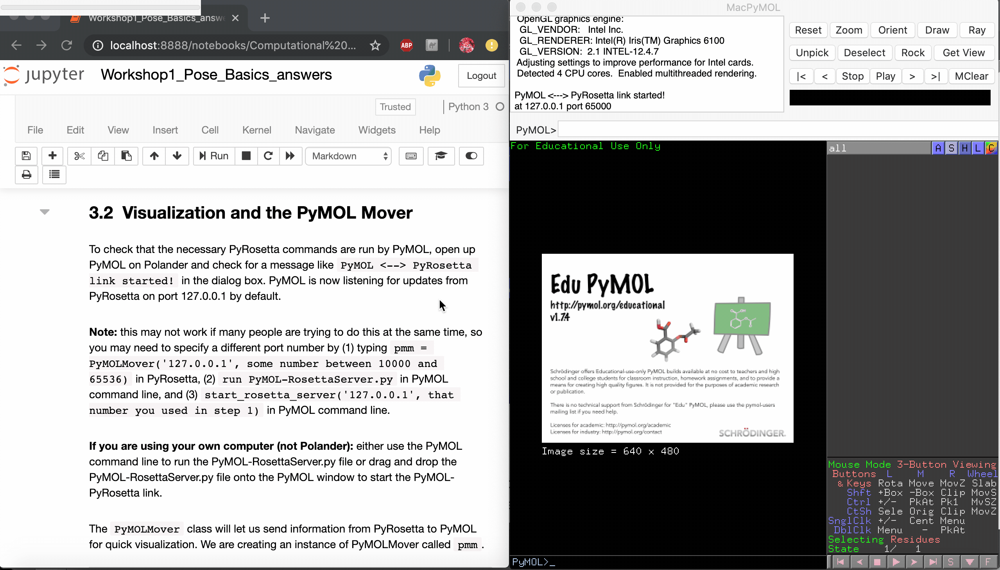

In [2]:
from pathlib import Path
gifPath = Path("./Media/PyMOL-tutorial.gif")
# Display GIF in Jupyter, CoLab, IPython
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png',width='800')

## Exercise 7: Visualizing changes in backbone angles

Use a `for` loop to change some backbone torsions (phi and psi) of `test_pose`. Be sure to `keep_history` and send to PyMOL. Try printing the $\phi$ and $\psi$ before and after you set it to make sure it is working as you expect.

In [ ]:
test_pose = Pose()
test_pose.assign(pose)

# use a for loop here
# set some phi and psi values
# send the structure to PyMOL

## Additional Exercises ##

The following exercises are meant to get you more comfortable with `Pose` methods and python coding. Many will require looping through the residues in a pose. As you find residues that answer these questions, view them in the PyMOL structure to check your work.

**PyMOL Instructios:** View the original protein (5tj3) in PyMOL, view as cartoon, view Zn2+ atoms as spheres, and color the substrate mimic residue TPO distinctly (in PyMOL, try `select resn TPO`).

- Create the Ramachandran plot for the protein and compare with the [Ramachandran plot](http://kinemage.biochem.duke.edu/teaching/anatax/html/anatax.1b.html)
from  [Richardson's Anatomy and Taxonomy of Protein Structure](http://kinemage.biochem.duke.edu/teaching/anatax/).

Don't forget to label your axes!

In [ ]:
import matplotlib
# this inline command gets plots to appear within the notebook
# %matplotlib inline (Uncomment this)
import matplotlib.pyplot as plt

# example of how to make a scatter plot from a list
# uncomment to see how it works and pops up in the notebook
#x_coords = list(range(10))
#y_coords = list(range(10))
#plt.scatter(x_coords, y_coords)
#plt.xlabel("X axis")
#plt.ylabel("Y axis")

# A Ramachandran plot is psi vs phi. Collect these values from the pose and plot them

### Analyzing Amino Acid Patterns

- Find all the polar amino acids in the protein. Using PyMOL, figure out where they are they located in the protein. Are there any patterns here?

Hint, don't type in a residue number one-by-one. Try `select resn XXX` and replace XXX with polar residue names in PyMOL

### Active Site Residues

- Find all residues that coordinate with the Zn2+ atoms around TPO (have any side-chain atoms within < 2.3 Angstroms). These residues may have a role in catalysis.

Consider how you could loop through every atom index in a residue

- Get all residue types within 8 Angstroms of the active site. Are there any patterns in terms of residue types here?

Perhaps residues with backbone atoms within 8-9 Angstroms to the Zn atoms are within the active site

## Answers

### Exercise 6

In [ ]:
# three alanines
tripeptide = pose_from_sequence("AAA")

orig_phi = tripeptide.phi(2)
orig_psi = tripeptide.psi(2)
print("original phi:", orig_phi)
print("original psi:", orig_psi)

# print the xyz coordinates of the CB atom of residue 2 here BEFORE setting
print("xyz coordinates:", tripeptide.residue(2).xyz("CB"))

# set the phi and psi here
tripeptide.set_phi(2, -60)
tripeptide.set_psi(2, -43)

print("new phi:", tripeptide.phi(2))
print("new psi:", tripeptide.psi(2))

# print the xyz coordinates of the CB atom of residue 2 here AFTER setting
print("xyz coordinates:", tripeptide.residue(2).xyz("CB"))
# did changing the phi and psi angle change the xyz coordinates of the CB atom of alanine 2?


## References
This notebook includes some concepts and exercises from:

"Workshop #2: PyRosetta" in the PyRosetta workbook: https://graylab.jhu.edu/pyrosetta/downloads/documentation/pyrosetta4_online_format/PyRosetta4_Workshop2_PyRosetta.pdf

"Workshop #4.1: PyMOL_Mover" in the PyRosetta workbook: 
http://www.pyrosetta.org/pymol_mover-tutorial

<!--NAVIGATION-->
< [Protein Geometry](http://nbviewer.jupyter.org/github/RosettaCommons/PyRosetta.notebooks/blob/master/notebooks/02.05-Protein-Geometry.ipynb) | [Contents](toc.ipynb) | [Index](index.ipynb) | [RosettaScripts in PyRosetta](http://nbviewer.jupyter.org/github/RosettaCommons/PyRosetta.notebooks/blob/master/notebooks/02.07-RosettaScripts-in-PyRosetta.ipynb) ><p><a href="https://colab.research.google.com/github/RosettaCommons/PyRosetta.notebooks/blob/master/notebooks/02.06-Visualization-and-PyMOL-Mover.ipynb"><img align="left" src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab" title="Open in Google Colaboratory"></a>